### Thresholding Studies - Breast Termo Images for Cancer Detection ###

* OpenCV Thresholding studies based on the work of Lucas Lattari shown in this video: https://www.youtube.com/watch?v=65Xbn1IuYqk&ab_channel=UniversoDiscreto (Image Thresholding for Breast Cancer Detection).

* Lucas github project link: https://github.com/lucaslattari/Python_OpenCV4/blob/master/10_thresholding.ipynb (Also Images Data reference).

* His work was published in this paper: https://sol.sbc.org.br/index.php/sbcas/article/view/9896

* OpenCV Ref: https://docs.opencv.org/master/d7/d4d/tutorial_py_thresholding.html

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import cv2
import glob

In [2]:
import sys
sys.path.append('C:/Users/Mafeus/Desktop/Git_Repos/OpenCV')
import OpCV_Utils

#### Loading Images Data (Breast Termo Images)

In [5]:
mama_images = glob.glob('base_mama/*jpg')

##### Visualization

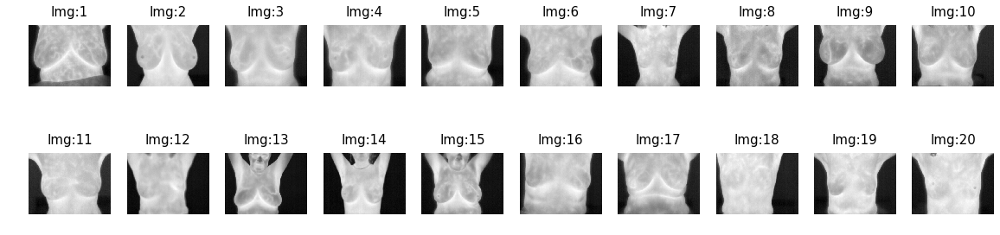

In [7]:
# Let's check 20 first images of the dataset:
images = []
titles = []

for i, image in enumerate(mama_images):
    image = cv2.imread(image)
    
    images.append(image)
    titles.append('Img:{}'.format(i+1))
        
    if (i == 19):
        break

images_array = [images[:10], images[10:20]]
titles_array = [titles[:10], titles[10:20]]

OpCV_Utils.show_multiple_images_plt(images_array, titles_array, fig_size = (20,5))

#### Simple Thresholding cv2 Options:

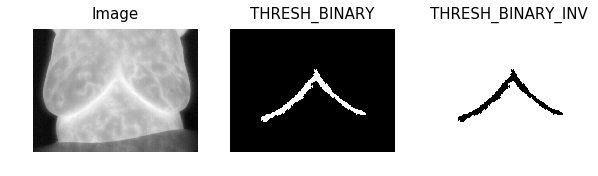

In [8]:
# cv2.THRESH_BINARY (Thresh = 230)

test_img = images_array[0][0]
thresh, img_thresh = cv2.threshold(test_img, 230, 255, cv2.THRESH_BINARY)
thresh, img_thresh_inv = cv2.threshold(test_img, 230, 255, cv2.THRESH_BINARY_INV)

OpCV_Utils.show_multiple_images_plt([[test_img, img_thresh, img_thresh_inv]], [['Image', 'THRESH_BINARY', 'THRESH_BINARY_INV']], fig_size = (10,10))

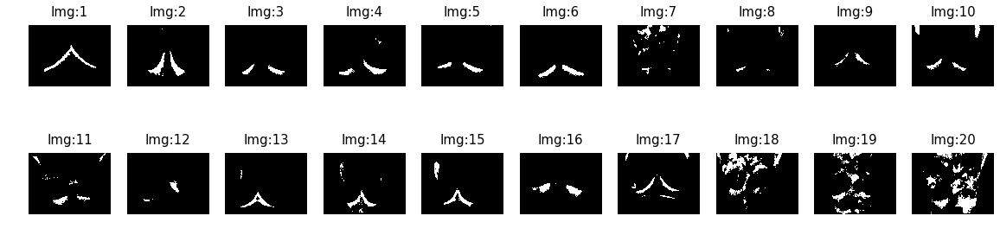

In [9]:
# Let's see how it goes for other images:

# Let's check 20 first images of the dataset:
images = []
titles = []

for i, image in enumerate(mama_images):
    image = cv2.imread(image)
    _, thresh_image = cv2.threshold(image, 230, 255, cv2.THRESH_BINARY)
    
    images.append(thresh_image)
    titles.append('Img:{}'.format(i+1))
        
    if (i == 19):
        break

images_array_thresh = [images[:10], images[10:20]]
titles_array_thresh = [titles[:10], titles[10:20]]

OpCV_Utils.show_multiple_images_plt(images_array_thresh , titles_array_thresh , fig_size = (20,5))

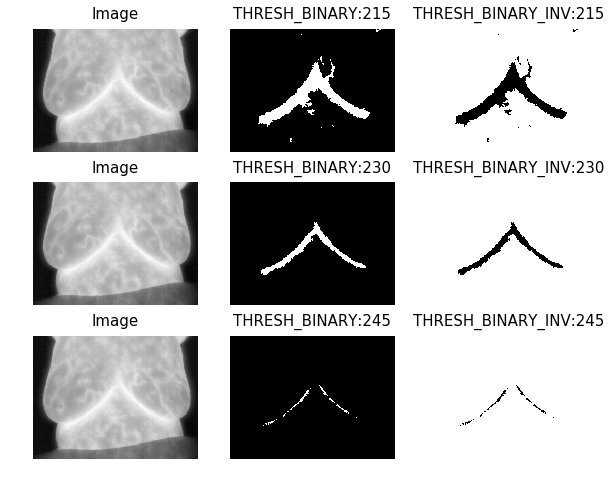

In [10]:
# Let's test more thresh values:

test_img = images_array[0][0]

binary_imgs = []
titles = []

for thresh in range(215,260,15):
    
    _, img_thresh = cv2.threshold(test_img, thresh, 255, cv2.THRESH_BINARY)
    _, img_thresh_inv = cv2.threshold(test_img, thresh, 255, cv2.THRESH_BINARY_INV)
    binary_imgs.append([test_img, img_thresh, img_thresh_inv])
    titles.append(['Image', 'THRESH_BINARY:{}'.format(thresh), 'THRESH_BINARY_INV:{}'.format(thresh)])
    
OpCV_Utils.show_multiple_images_plt(binary_imgs, titles, fig_size = (10,8))  

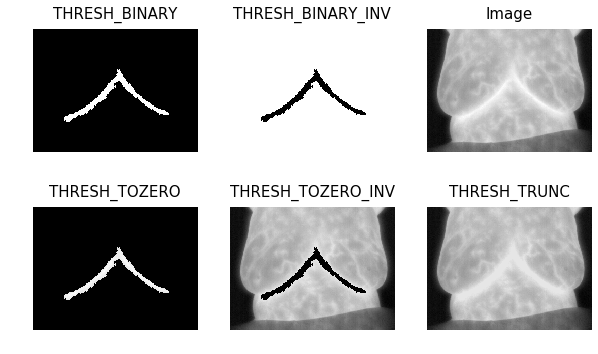

In [11]:
# Other Options:
test_img = images_array[0][0]

thresh = 230

_, img_thresh = cv2.threshold(test_img, thresh, 255, cv2.THRESH_BINARY)
_, img_thresh_inv = cv2.threshold(test_img, thresh, 255, cv2.THRESH_BINARY_INV)

_, img_thresh_zero = cv2.threshold(test_img, thresh, 255, cv2.THRESH_TOZERO)
_, img_thresh_zero_inv = cv2.threshold(test_img, thresh, 255, cv2.THRESH_TOZERO_INV)

_, img_thresh_trunc = cv2.threshold(test_img, thresh, 255, cv2.THRESH_TRUNC)

binary_imgs = [[img_thresh, img_thresh_inv, test_img], [img_thresh_zero, img_thresh_zero_inv, img_thresh_trunc]]
titles = [['THRESH_BINARY', 'THRESH_BINARY_INV', 'Image'], ['THRESH_TOZERO', 'THRESH_TOZERO_INV', 'THRESH_TRUNC']]

OpCV_Utils.show_multiple_images_plt(binary_imgs, titles, fig_size = (10,6))  

#### Adaptive Thresholding

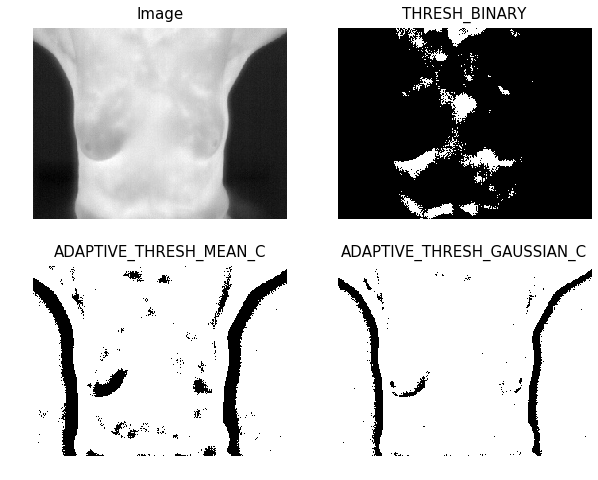

In [12]:
# Let's get a test image which the simple thresholding did not work well:
test_image = images_array[1][8]

# The blockSize determines the size of the neighbourhood area.
# C is a constant that is subtracted from the mean or weighted sum of the neighbourhood pixels.
block_size, C = 33, 10

test_image_copy = test_image.copy()
test_image_copy = test_image_copy[:,:,0]

_, img_thresh = cv2.threshold(test_image, 230, 255, cv2.THRESH_BINARY)
img_adapMean = cv2.adaptiveThreshold(test_image_copy, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY, block_size, C)
img_adapGauss = cv2.adaptiveThreshold(test_image_copy, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, block_size, C)

img_adapMean = cv2.cvtColor(img_adapMean, cv2.COLOR_GRAY2RGB)
img_adapGauss = cv2.cvtColor(img_adapGauss, cv2.COLOR_GRAY2RGB)

OpCV_Utils.show_multiple_images_plt([[test_image, img_thresh], [img_adapMean, img_adapGauss]],
                                    [['Image', 'THRESH_BINARY'], ['ADAPTIVE_THRESH_MEAN_C', 'ADAPTIVE_THRESH_GAUSSIAN_C']], fig_size = (10,8))

#### Otsu Binarization ####

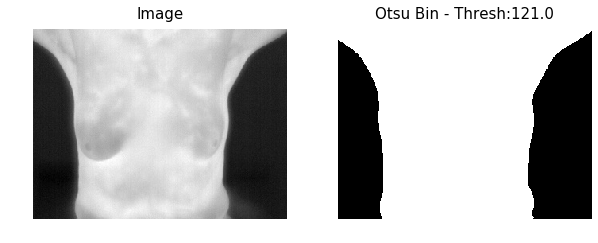

In [13]:
test_image = images_array[1][8]
thresh, otsu_bin = cv2.threshold(test_image.copy()[:,:,0], 0, 255, cv2.THRESH_BINARY+cv2.THRESH_OTSU)
otsu_bin = cv2.cvtColor(otsu_bin, cv2.COLOR_GRAY2RGB)

OpCV_Utils.show_multiple_images_plt([[test_image, otsu_bin]], [['Image', 'Otsu Bin - Thresh:{}'.format(thresh)]], fig_size=(10,10))

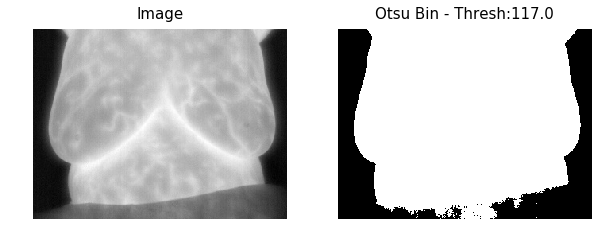

In [14]:
test_image = images_array[0][0]
thresh, otsu_bin = cv2.threshold(test_image.copy()[:,:,0], 0, 255, cv2.THRESH_BINARY+cv2.THRESH_OTSU)
otsu_bin = cv2.cvtColor(otsu_bin, cv2.COLOR_GRAY2RGB)

OpCV_Utils.show_multiple_images_plt([[test_image, otsu_bin]], [['Image', 'Otsu Bin - Thresh:{}'.format(thresh)]], fig_size=(10,10))

## Using Otsu to remove non interesting background info ##

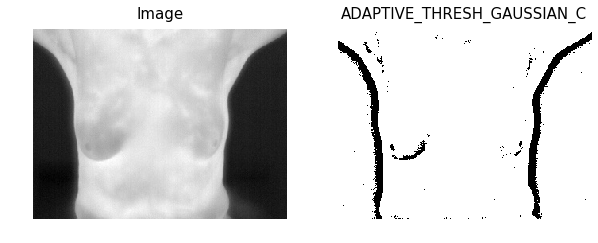

In [15]:
# Let's get a test image which the simple thresholding did not work well:
test_image = images_array[1][8]

# The blockSize determines the size of the neighbourhood area.
# C is a constant that is subtracted from the mean or weighted sum of the neighbourhood pixels.
block_size, C = 31, 10

test_image_copy = test_image.copy()
test_image_copy = test_image_copy[:,:,0]

img_adapGauss = cv2.adaptiveThreshold(test_image_copy, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, block_size, C)

img_adapGauss = cv2.cvtColor(img_adapGauss, cv2.COLOR_GRAY2RGB)

OpCV_Utils.show_multiple_images_plt([[test_image, img_adapGauss]], [['Image', 'ADAPTIVE_THRESH_GAUSSIAN_C']], fig_size = (10,8))

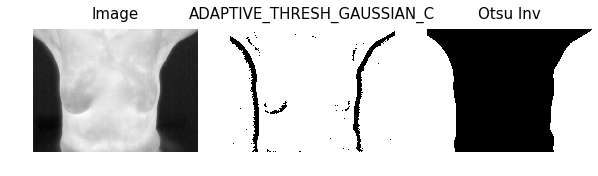

In [16]:
thresh, otsu_bin = cv2.threshold(test_image.copy()[:,:,0], 0, 255, cv2.THRESH_BINARY+cv2.THRESH_OTSU)
otsu_bin = cv2.cvtColor(otsu_bin, cv2.COLOR_GRAY2RGB)
otsu_bin = cv2.bitwise_not(otsu_bin)

OpCV_Utils.show_multiple_images_plt([[test_image, img_adapGauss, otsu_bin]], 
                                    [['Image', 'ADAPTIVE_THRESH_GAUSSIAN_C', 'Otsu Inv']], fig_size = (10,8))

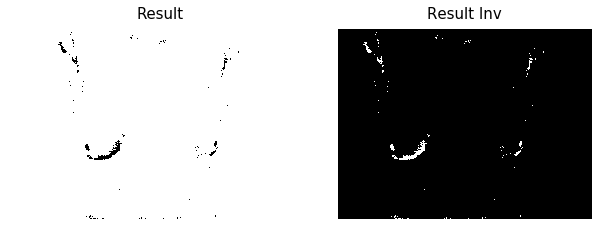

In [17]:
# Let's do a OR operation to take off the background and body contours:
output = cv2.bitwise_or(otsu_bin, img_adapGauss)
output_inv = cv2.bitwise_not(output)
OpCV_Utils.show_multiple_images_plt([[output, output_inv]], [['Result', 'Result Inv']], fig_size=(10,10))

#### Much Better Results with Otsu + Adaptive Gaussian

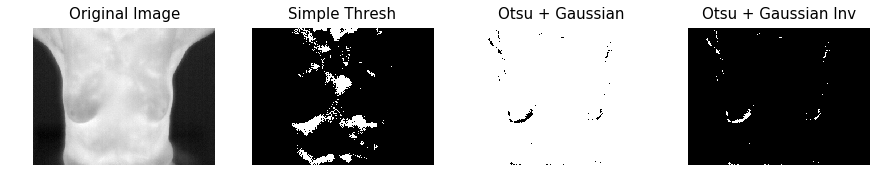

In [60]:
test_image = images_array[1][8]

_, img_thresh = cv2.threshold(test_image.copy(), 230, 255, cv2.THRESH_BINARY)

OpCV_Utils.show_multiple_images_plt([[test_image, img_thresh, output, output_inv]], 
                            [['Original Image', 'Simple Thresh','Otsu + Gaussian', 'Otsu + Gaussian Inv']], fig_size=(15,15))

#### Contour Detection ####

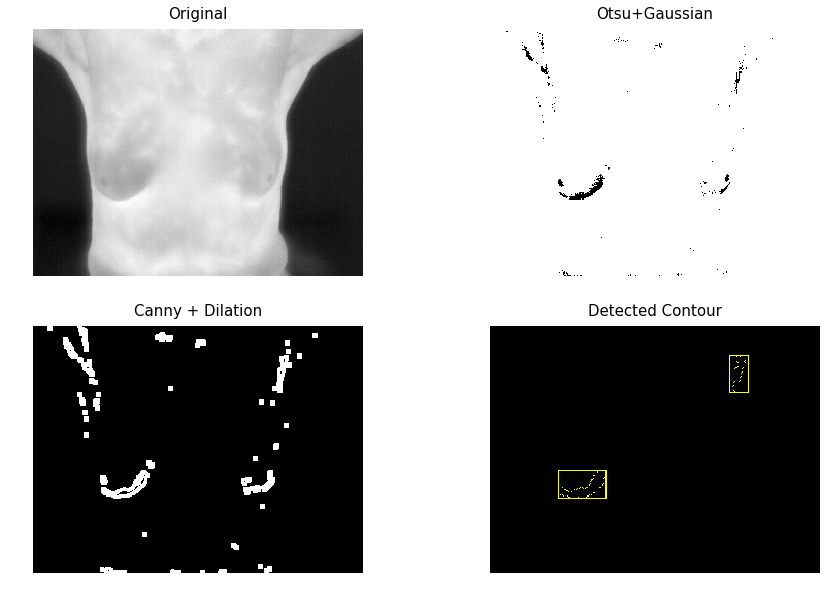

In [61]:
output_inv_left = output_inv.copy()
output_inv_right = output_inv.copy()

output_inv_right[:,:160,:] = [0,0,0]
output_inv_left[:,160:,:] = [0,0,0]

conts_right, img_canny_1 = OpCV_Utils.find_contours(output_inv_right, c_thresh = (100,100), dil = 1, ero = 0)
conts_left, img_canny_2 = OpCV_Utils.find_contours(output_inv_left, c_thresh = (100,100), dil = 1, ero = 0)

img_canny = cv2.bitwise_or(img_canny_1, img_canny_2)

biggest_cont_right = conts_right[0][0]
biggest_cont_left = conts_left[0][0]

black_board = np.zeros_like(output_inv)
cv2.drawContours(black_board, biggest_cont_right, -1, (255,255,0), 1)
cv2.rectangle(black_board, conts_right[0][3], conts_right[0][4], (255,255,0), 1)

cv2.drawContours(black_board, biggest_cont_left, -1, (255,255,0), 1)
cv2.rectangle(black_board, conts_left[0][3], conts_left[0][4], (255,255,0), 1)

img_canny_show = cv2.cvtColor(img_canny.copy(), cv2.COLOR_GRAY2RGB)

OpCV_Utils.show_multiple_images_plt([[test_image, output], [img_canny_show, black_board]], 
                                    [['Original', 'Otsu+Gaussian'], ['Canny + Dilation','Detected Contour']], fig_size = (15,10))

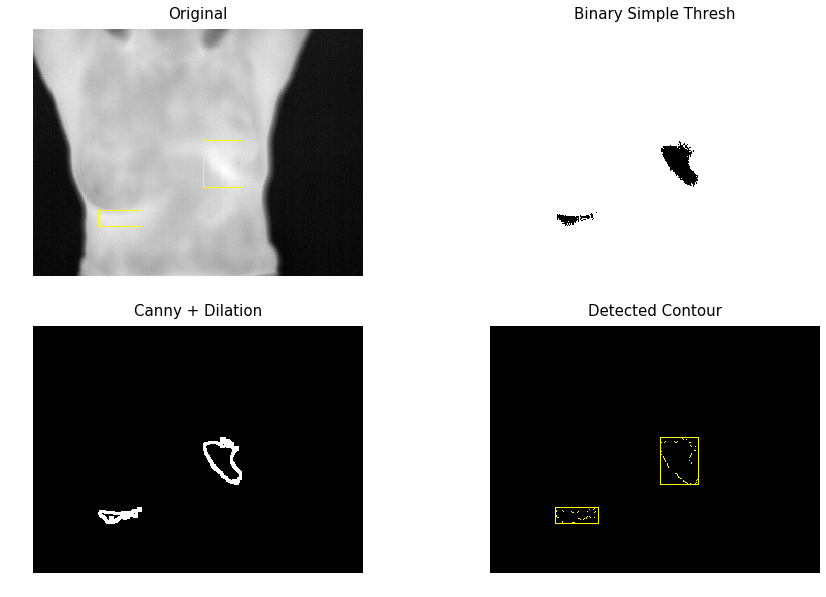

In [43]:
# cv2.THRESH_BINARY (Thresh = 230)

test_img = images_array[1][1].copy()
thresh, img_thresh = cv2.threshold(test_img, 230, 255, cv2.THRESH_BINARY)
thresh, img_thresh_inv = cv2.threshold(test_img, 230, 255, cv2.THRESH_BINARY_INV)

conts, img_canny = OpCV_Utils.find_contours(img_thresh_inv, c_thresh = (100,100), dil = 1, ero = 0)

biggest_cont = conts[0][0]
second_biggest_cont = conts[1][0]

black_board = np.zeros_like(test_img)
cv2.drawContours(black_board, biggest_cont, -1, (255,255,0), 1)
cv2.rectangle(black_board, conts[0][3], conts[0][4], (255,255,0), 1)
cv2.rectangle(test_img, conts[0][3], conts[0][4], (255,255,0), 1)

cv2.drawContours(black_board, second_biggest_cont, -1, (255,255,0), 1)
cv2.rectangle(black_board, conts[1][3], conts[1][4], (255,255,0), 1)
cv2.rectangle(test_img, conts[1][3], conts[1][4], (255,255,0), 1)


img_canny_show = cv2.cvtColor(img_canny.copy(), cv2.COLOR_GRAY2RGB)

OpCV_Utils.show_multiple_images_plt([[test_img, img_thresh_inv], [img_canny_show, black_board]], 
                                    [['Original', 'Binary Simple Thresh'], ['Canny + Dilation','Detected Contour']], fig_size = (15,10))

In [77]:
def detect_interest_area(img, thresh=230):
    
    edit_img = img.copy()
    
    thresh, img_thresh_inv = cv2.threshold(edit_img, thresh, 255, cv2.THRESH_BINARY_INV)
    
    img_thresh_inv_left = img_thresh_inv.copy()
    img_thresh_inv_right = img_thresh_inv.copy()

    img_thresh_inv_right[:,:(img_thresh_inv.shape[1]//2),:] = [255,255,255]
    img_thresh_inv_left[:,(img_thresh_inv.shape[1]//2):,:] = [255,255,255]

    conts_right, _ = OpCV_Utils.find_contours(img_thresh_inv_right, c_thresh = (100,100), dil = 1, ero = 0)
    conts_left, _ = OpCV_Utils.find_contours(img_thresh_inv_left, c_thresh = (100,100), dil = 1, ero = 0)

    if (len(conts_right) != 0) & (len(conts_left) != 0):
        biggest_cont_right = conts_right[0][0]
        biggest_cont_left = conts_left[0][0]

        cv2.drawContours(edit_img, biggest_cont_right, -1, (0,0,255), 1)
        cv2.rectangle(edit_img, conts_right[0][3], conts_right[0][4], (0,0,255), 1)

        cv2.drawContours(edit_img, biggest_cont_left, -1, (255,0,0), 1)
        cv2.rectangle(edit_img, conts_left[0][3], conts_left[0][4], (255,0,0), 1)

    return edit_img

In [ ]:
imgs = []
titles = []

imgs_array = []
titles_array = []

for i, image in enumerate(mama_images):
    image = cv2.imread(image)
    img_detect = detect_interest_area(image, thresh=230)
    
    imgs.append(img_detect)
    titles.append('Img:{}'.format(i+1))

for i in range(0, 280, 4):
    
    imgs_array.append(imgs[i:(i+4)])
    titles_array.append(titles[i:(i+4)])

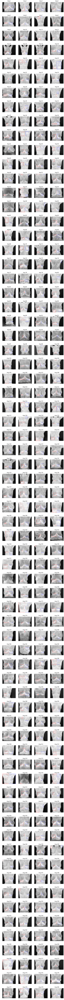

In [93]:
OpCV_Utils.show_multiple_images_plt(imgs_array, titles_array, fig_size = (15,250))